# 1.5 Random Numbers and Monte Carlo Simulation

In [1]:
using Random

Random.seed!(1974)
println("Seed 1974: ", rand(), "\t", rand(), "\t", rand())
Random.seed!(1975)
println("Seed 1975: ", rand(), "\t", rand(), "\t", rand())
Random.seed!(1974)
println("Seed 1974: ", rand(), "\t", rand(), "\t", rand())

Seed 1974: 0.21334106865797864	0.12757925830167505	0.5047074487066832
Seed 1975: 0.7672833719737708	0.8664265778687816	0.5807364110163316
Seed 1974: 0.21334106865797864	0.12757925830167505	0.5047074487066832


## Monte Carlo Simulation
$$
\hat{\pi} = 4\cdot \frac{\text{Number of points with } x^{2} + y^{2} \le 1}{\text{Total number of points}}
$$

In [2]:
using Plots, Random
totalNumberOfPoints=10^5
Random.seed!(1);
points = [eachcol(rand(2,totalNumberOfPoints))...];
inPoints = findall(x -> x[1]^2 + x[2]^2 <= 1,points)
println("the approximated value of pi is ", 4*length(inPoints)/totalNumberOfPoints)
scatter(first.(points[inPoints]),last.(points[inPoints]),ms=1,msw=0, size=(400,400));
outPoints = findall(x -> x[1]^2 + x[2]^2 > 1,points)
scatter!(first.(points[outPoints]),last.(points[outPoints]),ms=1, msw=0, size=(400,400), legend=:none)

the approximated value of pi is 3.14348


In [3]:
using Random, LinearAlgebra, Plots
Random.seed!()

N = 10^5;
data = [[rand(),rand()] for _ in 1:N];
indata = filter((x) -> (norm(x) <= 1), data);
outdata = filter((x) -> (norm(x) > 1), data);



# scatter(first.(indata), last.(indata), c=:blue, ms=1, msw=0)
# scatter!(first.(outdata), last.(outdata), c=:red, ms=1, msw=0,
#     xlims=(0,1), ylims=(0,1), legend=:none, ratio=:equal)

## Inside a Simple Pseudorandom Number Generator
- *Linear Congruential Generators*: $x_{n+1} = (ax_{n}+c) \mod m$

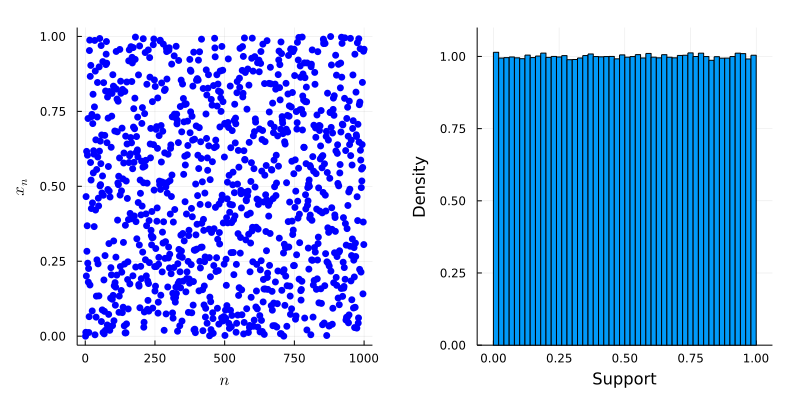

In [8]:
using Plots, LaTeXStrings, Measures

a, c, m = 69069, 1, 2^32
next(z) = (a*z + c) % m

N = 10^6
data = Array{Float64,1}(undef,N)

x = 808
for i in 1:N
    data[i] = x/m
    global x = next(x)
end

p1 = scatter(1:1000, data[1:1000],
    c=:blue, m=4, msw=0, xlabel=L"n", ylabel=L"x_n")
p2 = histogram(data, bins=50, normed=:true,
    ylims=(0,1.1), xlabel="Support", ylabel="Density")
plot(p1,p2, size=(800,400), legend=:none, margin=5mm)

1000000-element Vector{Float64}:
 1.8812716007232666e-7
 0.012993755051866174
 0.465667677577585
 0.20082260644994676
 0.6166048916056752
 0.28325831261463463
 0.36839398043230176
 0.6038344788830727
 0.24362197518348694
 0.7262039484921843
 0.18051840690895915
 0.2258467951323837
 0.012292998842895031
 ⋮
 0.7745715091004968
 0.8795620624441653
 0.4720909562893212
 0.8502599473576993
 0.6043040491640568
 0.6763717124704272
 0.3178086201660335
 0.7235862480010837
 0.37856318708509207
 0.9807687804568559
 0.7188973748125136
 0.5227809257339686